In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
pd.set_option('display.max_columns', None)

In [2]:
# task_name = "Juvenile" # satellite #openml_361236 #diabetes_classification
# directory = f'./results/mdi_local.real_data_classification/{task_name}/varying_sample_row_n'#varying_normalize'
# # directory = f'./results/mdi_local.real_data_regression/{task_name}/varying_sample_row_n'
# folder_names = [folder for folder in os.listdir(directory) if os.path.isdir(os.path.join(directory, folder))]
# experiments_seeds = []
# for folder_name in folder_names:
#     experiments_seeds.append(int(folder_name[4:]))
# combined_df = pd.DataFrame()
# for seed in experiments_seeds:
#     df = pd.read_csv(os.path.join(directory, f"seed{seed}/results.csv"))
#     combined_df = pd.concat([combined_df, df], ignore_index=True)
task_name = 'CCLE_PD-0325901' #'diabetes_pos_neg_new'#'CCLE_PD-0325901' #'CCLE_PD-diabetes_pos_neg_new' #'diabetes_pos_neg_new' '588'
task = "regression" #"classification" #"regression"
baseline = True
ablation_directory = f'./results/mdi_local.real_data_{task}_pos_neg/{task_name}/varying_sample_row_n'
folder_names = [folder for folder in os.listdir(ablation_directory) if os.path.isdir(os.path.join(ablation_directory, folder))]
experiments_seeds = []
for folder_name in folder_names:
    experiments_seeds.append(int(folder_name[4:]))
combined_df = pd.DataFrame()
for seed in experiments_seeds:
    df = pd.read_csv(os.path.join(ablation_directory, f"seed{seed}/results.csv"))
    combined_df = pd.concat([combined_df, df], ignore_index=True)

In [3]:
# df = pd.read_csv("./results/mdi_local.real_data_regression/diabetes_regression/varying_sample_row_n/seed331/results.csv")
# df = pd.read_csv("./results/mdi_local.real_data_classification/diabetes_classification/varying_sample_row_n/seed331/results.csv")
# df = pd.read_csv("./results/mdi_local.real_data_regression/satellite_new_implementation/varying_sample_row_n/seed331/results.csv")
# df = pd.read_csv("./results/mdi_local.real_data_regression/satellite_image/varying_sample_row_n/seed331/results.csv")
# df = pd.read_csv("./results/mdi_local.real_data_classification/juvenile_new/varying_sample_row_n/seed331/results.csv")
# df = pd.read_csv("./results/mdi_local.real_data_regression/ca_housing/varying_sample_row_n/seed331/results.csv")

In [4]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
combined_df

sample_row_n sample_row_n_name  rep  n_estimators  min_samples_leaf  \
0            NaN     keep_all_rows    0           100                 5   
1            NaN     keep_all_rows    0           100                 5   
2            NaN     keep_all_rows    0           100                 5   
3            NaN     keep_all_rows    0           100                 5   
4            NaN     keep_all_rows    0           100                 5   
5            NaN     keep_all_rows    0           100                 5   
6            NaN     keep_all_rows    0           100                 5   
7            NaN     keep_all_rows    0           100                 5   
8            NaN     keep_all_rows    0           100                 5   
9            NaN     keep_all_rows    0           100                 5   
10           NaN     keep_all_rows    0           100                 5   
11           NaN     keep_all_rows    0           100                 5   
12           NaN     keep_all_rows    0           100                 5   
13           NaN     keep_all_rows    0           100                 5   
14           NaN     keep_all_rows    0           100                 5   
15           NaN     keep_all_rows    0           100                 5   
16           NaN     keep_all_rows    0           100                 5   
17           NaN     keep_all_rows    0           100                 5   
18           NaN     keep_all_rows    0           100                 5   
19           NaN     keep_all_rows    0           100                 5   
20           NaN     keep_all_rows    0           100                 5   
21           NaN     keep_all_rows    0           100                 5   
22           NaN     keep_all_rows    0           100                 5   
23           NaN     keep_all_rows    0           100                 5   
24           NaN     keep_all_rows    0           100                 5   
25           NaN     keep_all_rows    0           100                 5   
26           NaN     keep_all_rows    0           100                 5   
27           NaN     keep_all_rows    0           100                 5   
28           NaN     keep_all_rows    0           100                 5   
29           NaN     keep_all_rows    0           100                 5   
30           NaN     keep_all_rows    0           100                 5   
31           NaN     keep_all_rows    0           100                 5   
32           NaN     keep_all_rows    0           100                 5   
33           NaN     keep_all_rows    0           100                 5   
34           NaN     keep_all_rows    0           100                 5   
35           NaN     keep_all_rows    0           100                 5   
36           NaN     keep_all_rows    0           100                 5   
37           NaN     keep_all_rows    0           100                 5   
38           NaN     keep_all_rows    0           100                 5   
39           NaN     keep_all_rows    0           100                 5   
40           NaN     keep_all_rows    0           100                 5   
41           NaN     keep_all_rows    0           100                 5   
42           NaN     keep_all_rows    0           100                 5   
43           NaN     keep_all_rows    0           100                 5   
44           NaN     keep_all_rows    0           100                 5   
45           NaN     keep_all_rows    0           100                 5   
46           NaN     keep_all_rows    0           100                 5   
47           NaN     keep_all_rows    0           100                 5   
48           NaN     keep_all_rows    0           100                 5   
49           NaN     keep_all_rows    0           100                 5   
50           NaN     keep_all_rows    0           100                 5   
51           NaN     keep_all_rows    0           100                 5   
52           NaN     keep_all

In [5]:
#################### Change the following according to the dataset ####################
task = "regression" #"regression" "classification"
########################################################################################
methods_all = ['Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus','TreeSHAP_RF']#,'Kernel_SHAP_RF_plus','LIME_RF_plus']
n_testsize = combined_df[['train_size', 'test_size']].drop_duplicates()
num_features = 5#combined_df['num_features'].drop_duplicates()[0]
metrics = {"regression": ["MSE"], "classification": ["AUPRC"]}#, "R_2"], "classification": ["AUROC","AUPRC", "F1"]}
ablation_models = {"regression": ["RF_Regressor", "Linear", "XGB_Regressor", "RF_Plus_Regressor"], 
                   "classification": ["RF_Classifier","LogisticCV", "SVM", "XGBoost_Classifier", "RF_Plus_Classifier"]}

In [6]:
combined_df['num_features'].drop_duplicates()[0]

1000

In [7]:
combined_df['fi'].drop_duplicates().tolist()

['Kernel_SHAP_RF_plus',
 'LIME_RF_plus',
 'Local_MDI+_fit_on_OOB_RFPlus',
 'Local_MDI+_fit_on_all_evaluate_on_all_RFPlus',
 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus',
 'Local_MDI+_fit_on_inbag_RFPlus',
 'Random',
 'TreeSHAP_RF']

In [8]:
# if task == "classification":
#     grouped = combined_df.groupby("model")
#     for model, group_df in grouped:
#         print("Model:", model)
#         print("RF AUROC:", group_df["test_all_auc_rf"].mean())
#         print("RF AUPRC:", group_df["test_all_auprc_rf"].mean())
#         print("RF F1:", group_df["test_all_f1_rf"].mean())
#         print("RF_plus AUROC:", group_df["test_all_auc_rf_plus"].mean())
#         print("RF_plus AUPRC:", group_df["test_all_auprc_rf_plus"].mean())
#         print("RF_plus F1:", group_df["test_all_f1_rf_plus"].mean())
# elif task == "regression":
#     grouped = combined_df.groupby("model")
#     for model, group_df in grouped:
#         print("Model:", model)
#         print("RF MSE:", group_df["test_all_mse_rf"].mean())
#         print("RF R2:", group_df["test_all_r2_rf"].mean())
#         print("RF_plus MSE:", group_df["test_all_mse_rf_plus"].mean())
#         print("RF_plus R2:", group_df["test_all_r2_rf_plus"].mean())

# Training Data

In [9]:
# fig, axs = plt.subplots(len(ablation_models[task]), len(metrics[task]), figsize=(15, 20))
# for i, a_model in enumerate(ablation_models[task]):
#     for j, metric in enumerate(metrics[task]):
#         results = {}
#         for m in methods_all:
#             results[m] = []
#         for m in methods_all:
#             if metric == "MSE":
#                 results[m].append(np.log(combined_df[combined_df['fi'] == m][a_model+"_train_subset_"+metric+f"_before_ablation"].mean()))
#                 for k in range(num_features):
#                     results[m].append(np.log(combined_df[combined_df['fi'] == m][a_model+"_train_subset_"+metric+f"_after_ablation_{k+1}"].mean()))
#             else:
#                 results[m].append(combined_df[combined_df['fi'] == m][a_model+"_train_subset_"+metric+f"_before_ablation"].mean())
#                 for k in range(num_features):
#                     results[m].append(combined_df[combined_df['fi'] == m][a_model+"_train_subset_"+metric+f"_after_ablation_{k+1}"].mean())
#         ax = axs[i, j]
#         for m in methods_all:
#             if m in ["TreeSHAP_RF", "Kernel_SHAP_RF_plus", "LIME_RF_plus"]:
#                 ax.plot(range(num_features+1), results[m], label=m, linestyle='dashed')
#             else:
#                 ax.plot(range(num_features+1), results[m], label=m)
#         if metric == "MSE":
#             ax.set(xlabel='Number of features ablated', ylabel= f"log({metric})",
#                 title=f'Ablation model = {a_model}, Train size = 100')
#         else:
#             ax.set(xlabel='Number of features ablated', ylabel=metric,
#                     title=f'Ablation model = {a_model}, Train size = 100')
#         ax.legend()

# plt.tight_layout()
# plt.savefig(f"./{task_name}_{task}_train.png")
# plt.show()

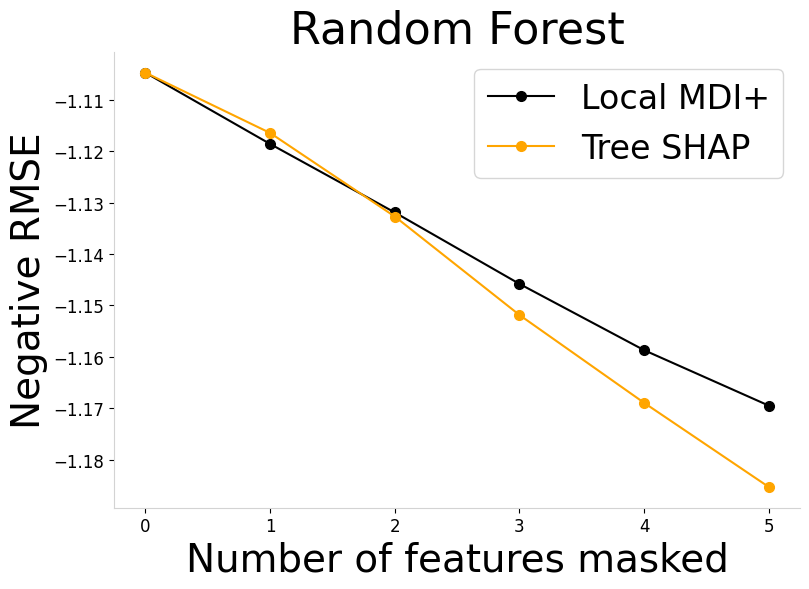

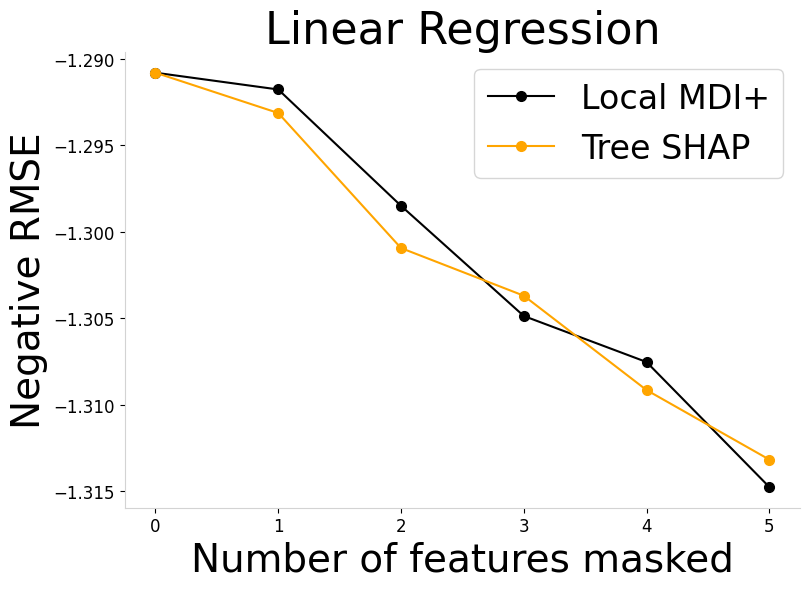

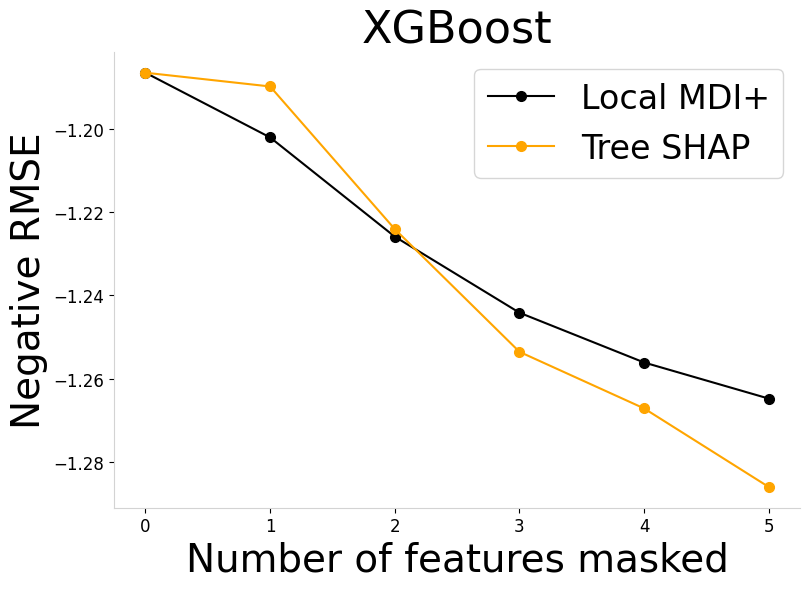

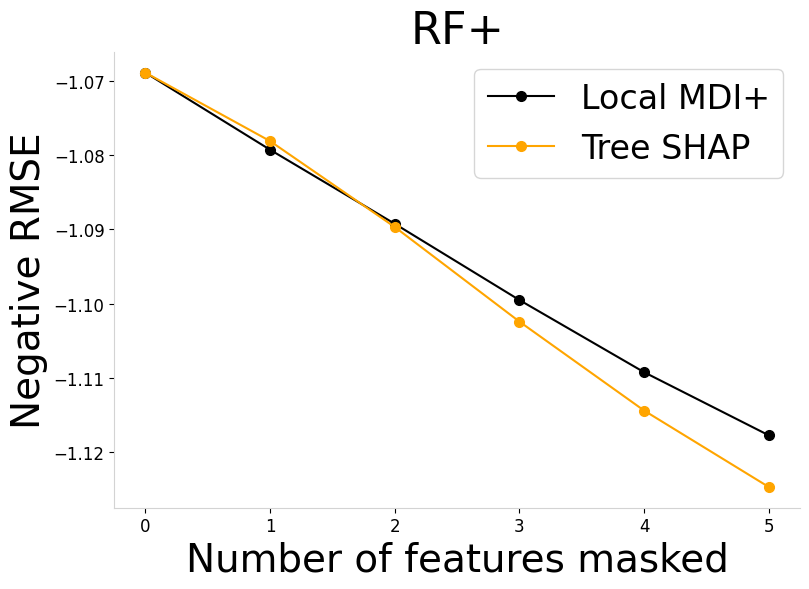

In [10]:
plt.rcParams['axes.labelsize'] = 28
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Remove chartjunk: Remove right and top spines, and change edge color to light grey
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.edgecolor'] = 'lightgrey'

# Increase data marker size
marker_size = 7

# Assuming you have defined variables like ablation_models, metrics, methods_all, num_features, and combined_df

# Loop through each combination of ablation model and metric
for i, a_model in enumerate(ablation_models[task]):
    for j, metric in enumerate(metrics[task]):
        fig, ax = plt.subplots(figsize=(8.2, 6))  # Create a new subplot for each combination
        results = {}
        for m in methods_all:
            results[m] = []
        for m in methods_all:
            if metric == "MSE":
                results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_before_ablation_positive"].mean()))
                for k in range(num_features):
                    results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_after_ablation_{k+1}_positive"].mean()))
            else:
                results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_before_ablation_positive"].mean())
                for k in range(num_features):
                    results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_after_ablation_{k+1}_positive"].mean())
        for m in methods_all:
            method_names = {'Kernel_SHAP_RF_plus': 'SHAP', 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus': "Local MDI+", 'LIME_RF_plus': 'LIME', 'TreeSHAP_RF': 'Tree SHAP'}
            colors = {'Kernel_SHAP_RF_plus': '#9B5DFF', 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus': "black", 'LIME_RF_plus': '#71BEB7', 'TreeSHAP_RF': 'orange'}
            ax.plot(range(num_features+1), results[m], '-o', label=method_names[m], color=colors[m], ms=marker_size)
        model_names = {'RF_Regressor': "Random Forest", 'Linear': "Linear Regression", 'XGB_Regressor': "XGBoost", 'RF_Plus_Regressor': "RF+"}
        #model_names = {'RF_Classifier': "Random Forest", 'LogisticCV': "Logistic Regression", 'SVM': "SVM", 'XGBoost_Classifier': "XGBoost", 'RF_Plus_Classifier': "RF+"}

        if metric == "MSE":
            ax.set(xlabel='Number of features masked', ylabel="Negative RMSE",
                   title=f'{model_names[a_model]} on Train data')
        else:
            ax.set(xlabel='Number of Positive features masked', ylabel=metric,
                   title=f'{model_names[a_model]} on Train data')
        ax.legend(loc='upper right', prop={'size': 24})  # Set legend to lower right
        ax.set_title(f'{model_names[a_model]}', fontsize=32)
        plt.tight_layout()
        plt.savefig(f"./{task_name}_{task}_{a_model}_{metric}_test1_presentation.png")
        plt.show()

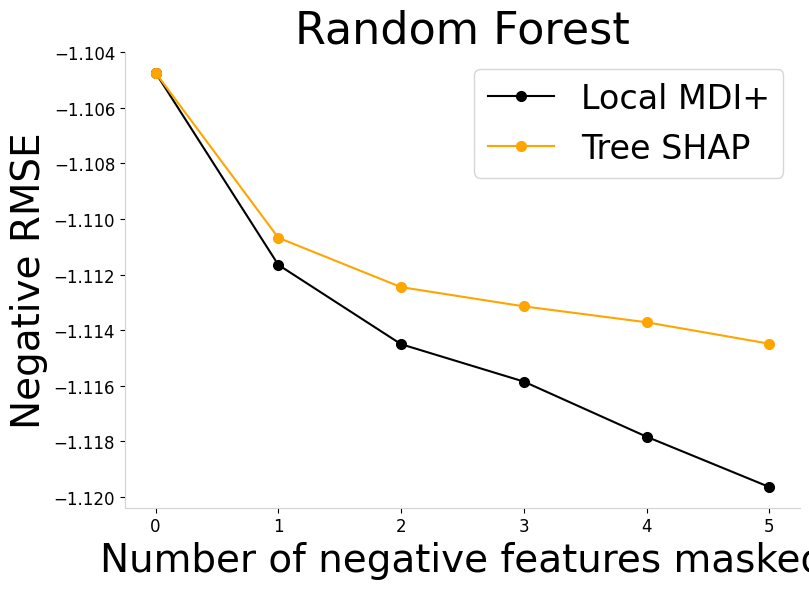

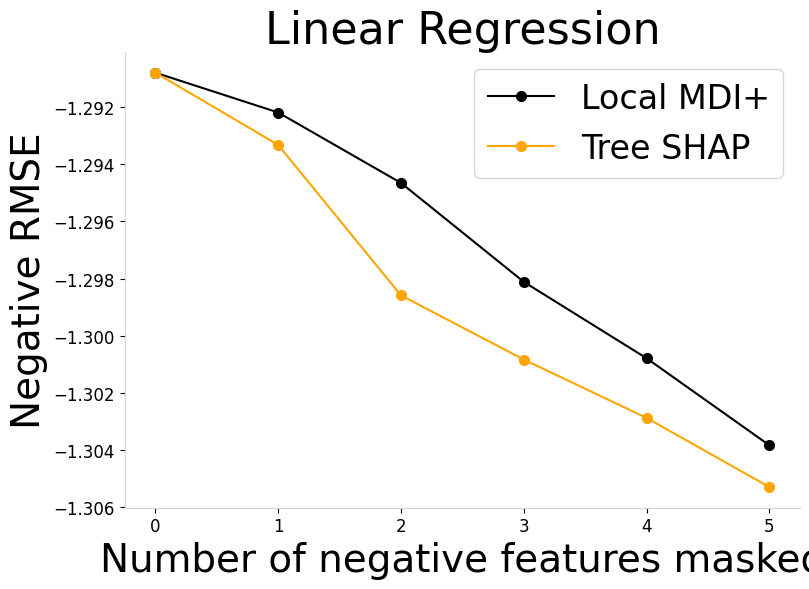

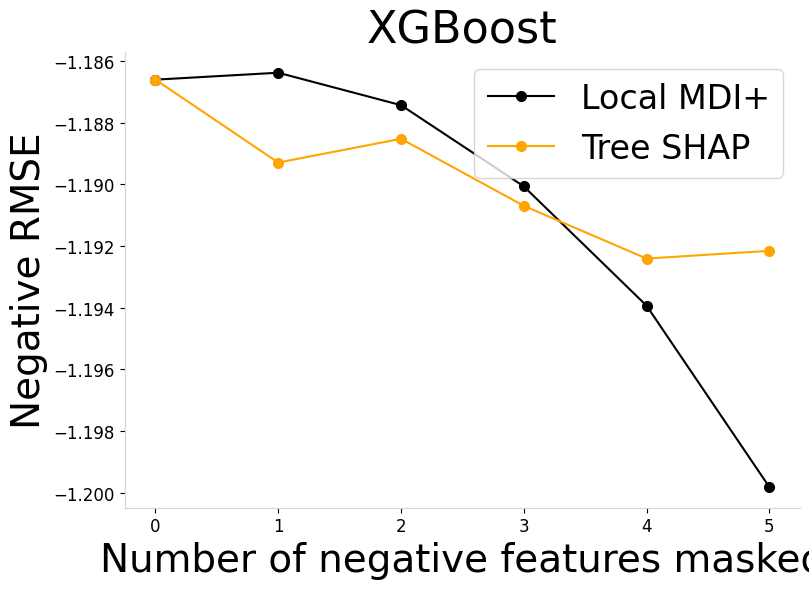

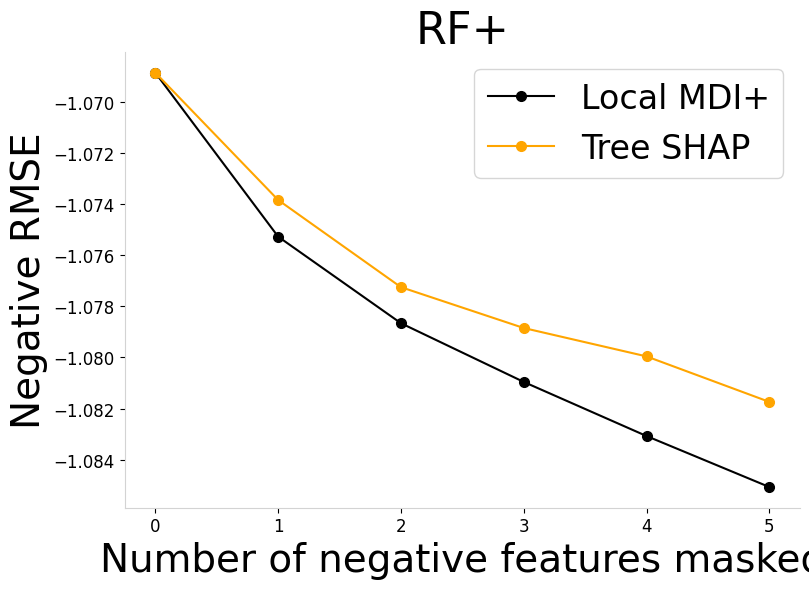

In [11]:
plt.rcParams['axes.labelsize'] = 28
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Remove chartjunk: Remove right and top spines, and change edge color to light grey
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.edgecolor'] = 'lightgrey'

# Increase data marker size
marker_size = 7

# Assuming you have defined variables like ablation_models, metrics, methods_all, num_features, and combined_df

# Loop through each combination of ablation model and metric
for i, a_model in enumerate(ablation_models[task]):
    for j, metric in enumerate(metrics[task]):
        fig, ax = plt.subplots(figsize=(8.2, 6))  # Create a new subplot for each combination
        results = {}
        for m in methods_all:
            results[m] = []
        for m in methods_all:
            if metric == "MSE":
                results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_before_ablation_negative"].mean()))
                for k in range(num_features):
                    results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_after_ablation_{k+1}_negative"].mean()))
            else:
                results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_before_ablation_negative"].mean())
                for k in range(num_features):
                    results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_after_ablation_{k+1}_negative"].mean())
        for m in methods_all:
            method_names = {'Kernel_SHAP_RF_plus': 'SHAP', 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus': "Local MDI+", 'LIME_RF_plus': 'LIME', 'TreeSHAP_RF': 'Tree SHAP'}
            colors = {'Kernel_SHAP_RF_plus': '#9B5DFF', 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus': "black", 'LIME_RF_plus': '#71BEB7', 'TreeSHAP_RF': 'orange'}
            ax.plot(range(num_features+1), results[m], '-o', label=method_names[m], color=colors[m], ms=marker_size)
        model_names = {'RF_Regressor': "Random Forest", 'Linear': "Linear Regression", 'XGB_Regressor': "XGBoost", 'RF_Plus_Regressor': "RF+"}
        #model_names = {'RF_Classifier': "Random Forest", 'LogisticCV': "Logistic Regression", 'SVM': "SVM", 'XGBoost_Classifier': "XGBoost", 'RF_Plus_Classifier': "RF+"}

        if metric == "MSE":
            ax.set(xlabel='Number of negative features masked', ylabel="Negative RMSE",
                   title=f'{model_names[a_model]} on Train data')
        else:
            ax.set(xlabel='Number of negative features masked', ylabel=metric,
                   title=f'{model_names[a_model]} on Train data')
        ax.legend(loc='upper right', prop={'size': 24})  # Set legend to lower right
        ax.set_title(f'{model_names[a_model]}', fontsize=32)
        plt.tight_layout()
        plt.savefig(f"./{task_name}_{task}_{a_model}_{metric}_test2_presentation.png")
        plt.show()

In [12]:
model_names = {'RF_Regressor': "Random Forest", 'Linear': "Linear Regression", 'XGB_Regressor': "XGBoost", 'RF_Plus_Regressor': "RF+"}

# Test data(subset)

In [13]:
# fig, axs = plt.subplots(len(ablation_models[task]), len(metrics[task]), figsize=(15, 20))
# for i, a_model in enumerate(ablation_models[task]):
#     for j, metric in enumerate(metrics[task]):
#         results = {}
#         for m in methods_all:
#             results[m] = []
#         for m in methods_all:
#             if metric == "MSE":
#                 results[m].append(np.log(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_before_ablation"].mean()))
#                 for k in range(num_features):
#                     results[m].append(np.log(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_after_ablation_{k+1}"].mean()))
#             else:
#                 results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_before_ablation"].mean())
#                 for k in range(num_features):
#                     results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_after_ablation_{k+1}"].mean())
#         ax = axs[i, j]
#         for m in methods_all:
#             if m in ["TreeSHAP_RF", "Kernel_SHAP_RF_plus", "LIME_RF_plus"]:
#                 ax.plot(range(num_features+1), results[m], label=m, linestyle='dashed')
#             else:
#                 ax.plot(range(num_features+1), results[m], label=m)
#         if metric == "MSE":
#             ax.set(xlabel='Number of features ablated', ylabel= f"log({metric})",
#                 title=f'Ablation model = {a_model}, Test size = 100')
#         else:
#             ax.set(xlabel='Number of features ablated', ylabel=metric,
#                     title=f'Ablation model = {a_model}, Test size = 100')
#         ax.legend()

# plt.tight_layout()
# plt.savefig(f"./{task_name}_{task}_test_subset_1.png")
# plt.show()

KeyError: 'RF_Regressor_test_subset_MSE_before_ablation'

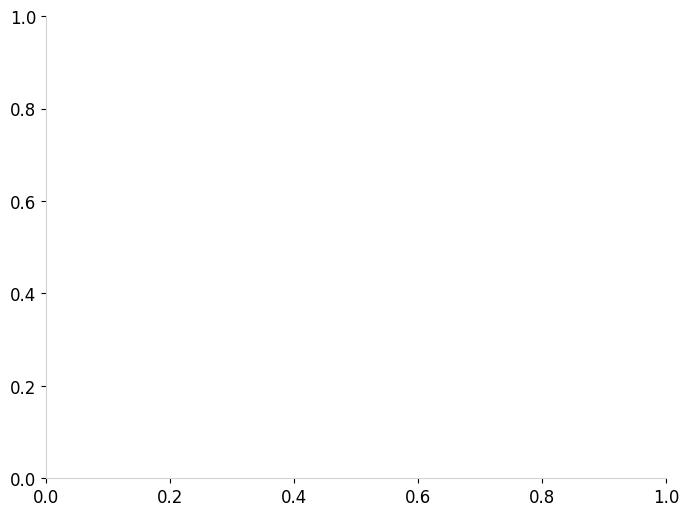

In [14]:
plt.rcParams['axes.labelsize'] = 34
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Remove chartjunk: Remove right and top spines, and change edge color to light grey
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.edgecolor'] = 'lightgrey'

# Increase data marker size
marker_size = 7

# Assuming you have defined variables like ablation_models, metrics, methods_all, num_features, and combined_df

# Loop through each combination of ablation model and metric
for i, a_model in enumerate(ablation_models[task]):
    for j, metric in enumerate(metrics[task]):
        fig, ax = plt.subplots(figsize=(8, 6))  # Create a new subplot for each combination
        results = {}
        for m in methods_all:
            results[m] = []
        for m in methods_all:
            if metric == "MSE":
                results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_before_ablation"].mean()))
                for k in range(num_features):
                    results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_after_ablation_{k+1}"].mean()))
            else:
                results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_before_ablation"].mean())
                for k in range(num_features):
                    results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_after_ablation_{k+1}"].mean())
        for m in methods_all:
            method_names = {'Kernel_SHAP_RF_plus': 'SHAP', 'LFI_evaluate_on_oob_RF_plus': "Local MDI+", 'LIME_RF_plus': 'LIME', 'TreeSHAP_RF': 'Tree SHAP'}
            colors = {'Kernel_SHAP_RF_plus': '#9B5DFF', 'LFI_evaluate_on_oob_RF_plus': "black", 'LIME_RF_plus': '#71BEB7', 'TreeSHAP_RF': 'orange'}
            ax.plot(range(num_features+1), results[m], '-o', label=method_names[m], color=colors[m], ms=marker_size)
        #model_names = {'RF_Regressor': "Random Forest", 'Linear': "Linear Regression", 'XGB_Regressor': "XGBoost", 'RF_Plus_Regressor': "RF+"}
        model_names = {'RF_Classifier': "Random Forest", 'LogisticCV': "Logistic Regression", 'SVM': "SVM", 'XGBoost_Classifier': "XGBoost", 'RF_Plus_Classifier': "RF+"}

        if metric == "MSE":
            ax.set(xlabel='Number of features masked', ylabel="Negative RMSE",
                   title=f'{model_names[a_model]} on Test data')
        else:
            ax.set(xlabel='Number of features masked', ylabel=metric,
                   title=f'{model_names[a_model]} on Test data')
        ax.legend(loc='upper right', prop={'size': 24})  # Set legend to lower right
        ax.set_title(f'{model_names[a_model]}', fontsize=32)
        plt.tight_layout()
        plt.savefig(f"./{task_name}_{task}_{a_model}_{metric}_test_presentation.png")
        plt.show()

In [ ]:
# fig, axs = plt.subplots(len(ablation_models[task]), len(metrics[task]), figsize=(15, 20))
# for i, a_model in enumerate(ablation_models[task]):
#     for j, metric in enumerate(metrics[task]):
#         results = {}
#         for m in methods_all:
#             results[m] = []
#         for m in methods_all:
#             if metric == "MSE":
#                 results[m].append(np.log(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_before_ablation_blank"].mean()))
#                 for k in range(num_features):
#                     results[m].append(np.log(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_after_ablation_{k+1}_blank"].mean()))
#             else:
#                 results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_before_ablation_blank"].mean())
#                 for k in range(num_features):
#                     results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_subset_"+metric+f"_after_ablation_{k+1}_blank"].mean())
#         ax = axs[i, j]
#         for m in methods_all:
#             if m in ["TreeSHAP_RF","Kernel_SHAP_RF_plus", "LIME_RF_plus"]:
#                 ax.plot(range(num_features+1), results[m], label=m, linestyle='dashed')
#             else:
#                 ax.plot(range(num_features+1), results[m], label=m)
#         if metric == "MSE":
#             ax.set(xlabel='Number of features ablated', ylabel= f"log({metric})",
#                 title=f'Ablation model = {a_model}, Test size = 100')
#         else:
#             ax.set(xlabel='Number of features ablated', ylabel=metric,
#                     title=f'Ablation model = {a_model}, Test size = 100')
#         ax.legend()
# plt.tight_layout()
# plt.savefig(f"./{task_name}_{task}_test_subset_2.png")
# plt.show()

# Test data

In [ ]:
plt.rcParams['axes.labelsize'] = 34
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

# Remove chartjunk: Remove right and top spines, and change edge color to light grey
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.edgecolor'] = 'lightgrey'

# Increase data marker size
marker_size = 7

# Assuming you have defined variables like ablation_models, metrics, methods_all, num_features, and combined_df
methods_all=['LFI_evaluate_on_oob_RF_plus',
 'TreeSHAP_RF']
# Loop through each combination of ablation model and metric
for i, a_model in enumerate(ablation_models[task]):
    for j, metric in enumerate(metrics[task]):
        fig, ax = plt.subplots(figsize=(8, 6))  # Create a new subplot for each combination
        results = {}
        for m in methods_all:
            results[m] = []
        for m in methods_all:
            if metric == "MSE":
                results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_before_ablation_positive"].mean()))
                for k in range(num_features):
                    results[m].append(-1*np.sqrt(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_after_ablation_{k+1}_positive"].mean()))
            else:
                results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_before_ablation_positive"].mean())
                for k in range(num_features):
                    results[m].append(combined_df[combined_df['fi'] == m][a_model+"_test_"+metric+f"_after_ablation_{k+1}_positive"].mean())
        for m in methods_all:
            method_names = {'Kernel_SHAP_RF_plus': 'SHAP', 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus': "Local MDI+", 'LIME_RF_plus': 'LIME', 'TreeSHAP_RF': 'Tree SHAP'}
            colors = {'Kernel_SHAP_RF_plus': '#9B5DFF', 'Local_MDI+_fit_on_all_evaluate_on_oob_RFPlus': "black", 'LIME_RF_plus': '#71BEB7', 'TreeSHAP_RF': 'orange'}
            ax.plot(range(num_features+1), results[m], '-o', label=method_names[m], color=colors[m], ms=marker_size)
        #model_names = {'RF_Regressor': "Random Forest", 'Linear': "Linear Regression", 'XGB_Regressor': "XGBoost", 'RF_Plus_Regressor': "RF+"}
        model_names = {'RF_Classifier': "Random Forest", 'LogisticCV': "Logistic Regression", 'SVM': "SVM", 'XGBoost_Classifier': "XGBoost", 'RF_Plus_Classifier': "RF+"}

        if metric == "MSE":
            ax.set(xlabel='Number of features masked', ylabel="Negative RMSE",
                   title=f'{model_names[a_model]} on Test data')
        else:
            ax.set(xlabel='Number of features masked', ylabel=metric,
                   title=f'{model_names[a_model]} on Test data')
        ax.legend(loc='upper right', prop={'size': 24})  # Set legend to lower right
        ax.set_title(f'{model_names[a_model]}', fontsize=32)
        plt.tight_layout()
        plt.savefig(f"./{task_name}_{task}_{a_model}_{metric}_full_test_presentation.png")
        plt.show()